In [1]:
import librosa
import librosa.display
import IPython.display
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline

In [2]:
def normalizedVar(Y):
    var_p = Y.var(1)
    var_p = np.sqrt(var_p)
    var_p = var_p.reshape(var_p.shape[0],1)
    return(var_p)

In [3]:
def varTrustFunc(Y, numFrames=100):
    
    x = int(Y.shape[1]/numFrames)
    varTrust = np.ones(Y.shape)
    
    for i in range(0, Y.shape[1], numFrames):
        indiceStart = i
        indiceStop = indiceStart+numFrames
        Y_p = Y[:,indiceStart:indiceStop]

        var_p = normalizedVar(Y_p)
        varTrust[:,indiceStart:indiceStop] = var_p
        
#     Y_p = Y[:,indiceStop:]
#     var_p = normalizedVar(Y_p)
#     varTrust[:,indiceStop:] = var_p
    
    return(varTrust)

In [4]:
def expandContrast(contrast_p, shape, n_bands, deltaF):
    contrast = np.ones(shape)
    
    for i in range(0, n_bands+1):
        
        if i == 0:
            indiceStart = 0
        else:
            indiceStart = deltaF * 2**(i-1)
        
        indiceStop = deltaF * 2**i - 1
        contrast[indiceStart:indiceStop,:] = contrast_p[i,:]
    
    contrast[indiceStop+1:,:] = contrast_p[n_bands,:]
    
    return(contrast)
    


def contrastTrustFunc(Y, sr):
    n_bands = 8
    contrast_p = librosa.feature.spectral_contrast(S=Y, sr=sr, linear=True, n_bands=n_bands, fmin=64)
    deltaF = int(round(64/(sr/(2*Y.shape[0]))))
    contrast = expandContrast(contrast_p, Y.shape, n_bands, deltaF)
    contrast /= np.max(contrast)
    return(contrast)

In [5]:
def my_filter(y, sr):
    
    Y = librosa.stft(y, n_fft = 4096, hop_length = 512)
    Y_dB = librosa.amplitude_to_db(Y, ref=np.max)
       
    varTrust = varTrustFunc(Y_dB)
    contrast = contrastTrustFunc(np.abs(Y), sr)
    
    mask = np.multiply(contrast, varTrust)
    mask = mask / np.max(mask)
        
    mag, phase = librosa.magphase(Y)
    newmag = np.multiply(mag, mask)
    Y_rec = np.multiply(newmag, np.exp(np.multiply(phase, (1j))))
    y_rec = librosa.istft(Y_rec, hop_length=512)

    return y_rec, Y_rec

## Áudio #1 

In [6]:
y, sr = librosa.load("../audio/whittakeri.wav", sr=44100)
Y = librosa.stft(y, n_fft = 4096, hop_length = 512)
Y_dB = librosa.amplitude_to_db(Y, ref=np.max)

In [7]:
ys, Ys = my_filter(y,sr)

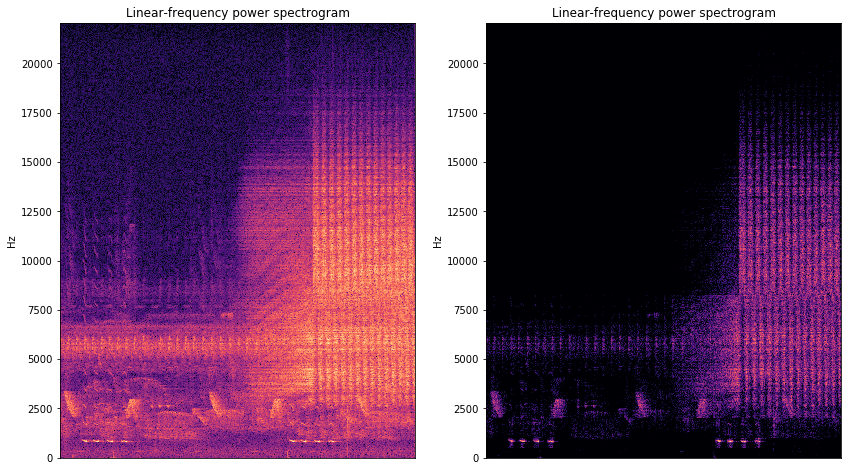

In [9]:
plt.figure(figsize=(14,8))
plt.subplot(1,2,2)
librosa.display.specshow(librosa.amplitude_to_db(Ys, np.max), y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

plt.subplot(1,2,1)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

In [9]:
IPython.display.Audio(data=ys, rate=sr)

In [10]:
IPython.display.Audio(data=y, rate=sr)

## Áudio #2 

In [13]:
y, sr = librosa.load("../audio/48054_44k.wav", sr=44100)

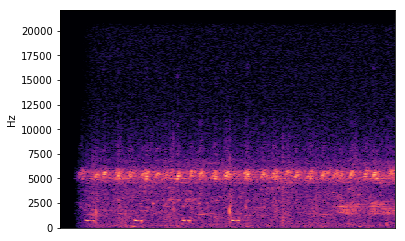

In [14]:
y = y[44100*4:44100*10]
Y = librosa.stft(y, n_fft = 4096, hop_length = 512)
Y_dB = librosa.amplitude_to_db(Y, ref=np.max)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)

In [15]:
ys, Ys = my_filter(y,sr)

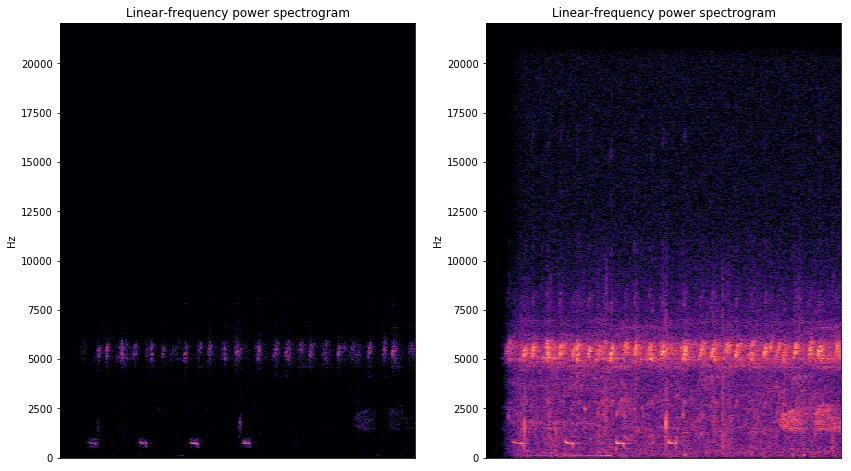

In [16]:
plt.figure(figsize=(14,8))
plt.subplot(1,2,1)
librosa.display.specshow(librosa.amplitude_to_db(Ys, np.max), y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

plt.subplot(1,2,2)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

In [17]:
IPython.display.Audio(data=ys, rate=sr)

In [18]:
IPython.display.Audio(data=y, rate=sr)

## Áudio #3

In [17]:
y, sr = librosa.load("../audio/48137_44k.wav", sr=44100)

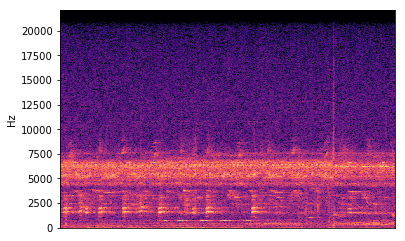

In [18]:
y = y[44100*10:44100*20]
Y = librosa.stft(y, n_fft = 4096, hop_length = 512)
Y_dB = librosa.amplitude_to_db(Y, ref=np.max)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)

In [19]:
ys, Ys = my_filter(y,sr)

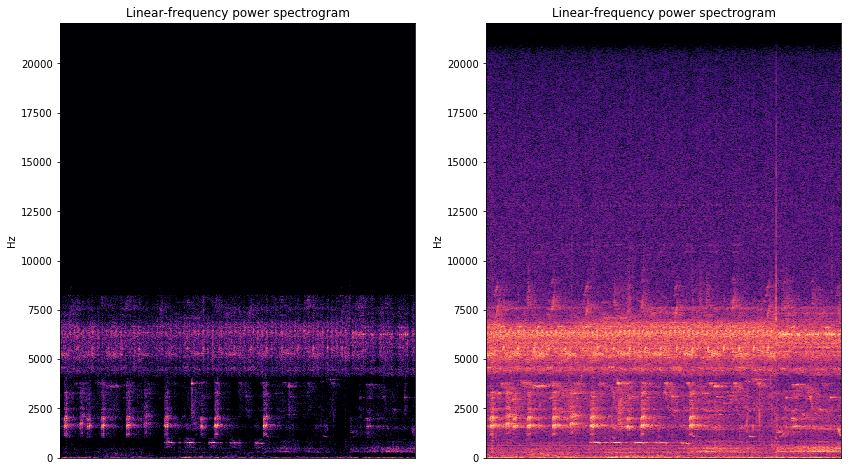

In [20]:
plt.figure(figsize=(14,8))
plt.subplot(1,2,1)
librosa.display.specshow(librosa.amplitude_to_db(Ys, np.max), y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

plt.subplot(1,2,2)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

In [21]:
IPython.display.Audio(data=ys, rate=sr)

In [22]:
IPython.display.Audio(data=y, rate=sr)

## Áudio #4

In [23]:
y, sr = librosa.load("../audio/48138_44k.wav", sr=44100)

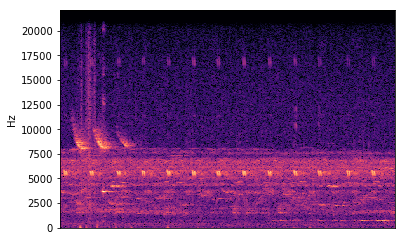

In [24]:
y = y[44100*10:44100*20]
Y = librosa.stft(y, n_fft = 4096, hop_length = 512)
Y_dB = librosa.amplitude_to_db(Y, ref=np.max)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)

In [25]:
ys, Ys = my_filter(y,sr)

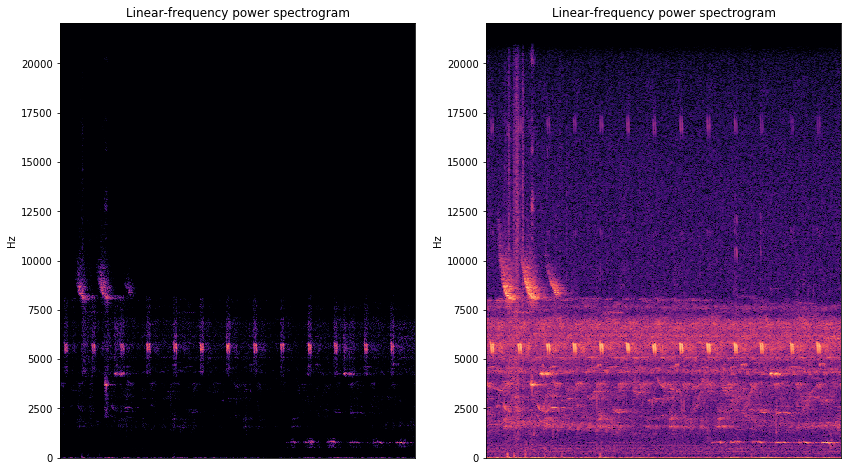

In [26]:
plt.figure(figsize=(14,8))
plt.subplot(1,2,1)
librosa.display.specshow(librosa.amplitude_to_db(Ys, np.max), y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

plt.subplot(1,2,2)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

In [27]:
IPython.display.Audio(data=ys, rate=sr)

In [28]:
IPython.display.Audio(data=y, rate=sr)

## Áudio #5 

In [10]:
y, sr = librosa.load("../audio/74395_44k.wav", sr=44100)

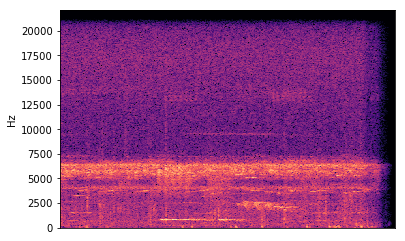

In [11]:
y = y[44100*5:44100*15]
Y = librosa.stft(y, n_fft = 4096, hop_length = 512)
Y_dB = librosa.amplitude_to_db(Y, ref=np.max)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)

In [12]:
ys, Ys = my_filter(y,sr)

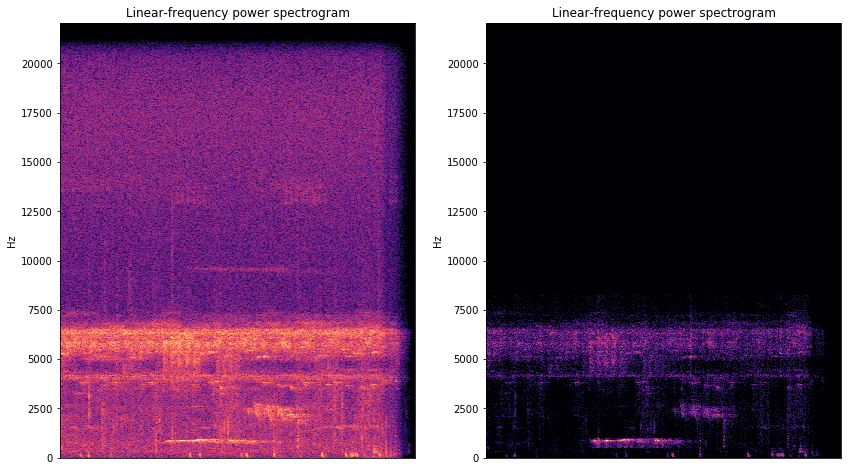

In [14]:
plt.figure(figsize=(14,8))
plt.subplot(1,2,2)
librosa.display.specshow(librosa.amplitude_to_db(Ys, np.max), y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

plt.subplot(1,2,1)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

In [15]:
IPython.display.Audio(data=ys, rate=sr)

In [16]:
IPython.display.Audio(data=y, rate=sr)

## Áudio #6 

In [35]:
y, sr = librosa.load("../audio/106054_44k.wav", sr=44100)

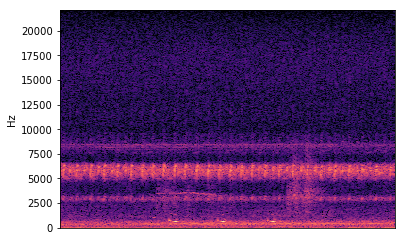

In [36]:
y = y[44100*7:44100*15]
Y = librosa.stft(y, n_fft = 4096, hop_length = 512)
Y_dB = librosa.amplitude_to_db(Y, ref=np.max)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)

In [37]:
ys, Ys = my_filter(y,sr)

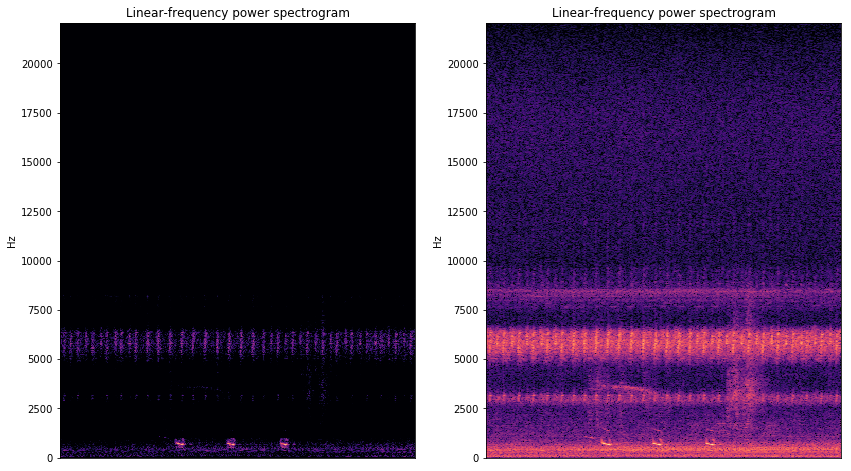

In [38]:
plt.figure(figsize=(14,8))
plt.subplot(1,2,1)
librosa.display.specshow(librosa.amplitude_to_db(Ys, np.max), y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

plt.subplot(1,2,2)
librosa.display.specshow(Y_dB, y_axis='linear', sr=sr, hop_length = 512)
#plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency power spectrogram')

In [39]:
IPython.display.Audio(data=ys, rate=sr)

In [40]:
IPython.display.Audio(data=y, rate=sr)